In [47]:
import cv2
import numpy as np
import requests
from PIL import Image, ImageFilter
from io import BytesIO
import matplotlib.pyplot as plt

In [48]:
def download_image(url):
    response = requests.get(url)
    if response.status_code == 200:
        image = Image.open(BytesIO(response.content))
        return cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
    else:
        raise Exception("Failed to download image")

In [49]:
def visualize_filter(name, image):
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display
    plt.title(f"Filter: {name}", fontsize=14, color=(0.2, 0.4, 0.8))  # Blue shades
    plt.axis('off')  # Hide axis

    # Save the figure
    plt.savefig(f"{name}.png", bbox_inches='tight', pad_inches=0.1, dpi=300)

    plt.show()

In [50]:
# Basic Filters
def apply_gaussian_blur(image):
    for ksize in [(5,5), (15,15), (25,25)]:
        blurred = cv2.GaussianBlur(image, ksize, 0)
        visualize_filter(f"Gaussian Blur {ksize}", blurred)

def apply_median_blur(image):
    for ksize in [3, 5, 7]:
        blurred = cv2.medianBlur(image, ksize)
        visualize_filter(f"Median Blur {ksize}", blurred)

def apply_bilateral_filter(image):
    filtered = cv2.bilateralFilter(image, 9, 75, 75)
    visualize_filter("Bilateral Filter", filtered)

In [51]:
# Edge Detection
def apply_edge_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Canny with different thresholds
    for thresh in [(100,200), (50,150)]:
        edges = cv2.Canny(gray, *thresh)
        visualize_filter(f"Canny Edge {thresh}", edges)

    # Apply Laplacian filter
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    laplacian = np.uint8(np.abs(laplacian))  # Convert to uint8

    # Apply Sobel filters
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

    # Convert Sobel to uint8
    sobel_x = np.uint8(np.abs(sobel_x))
    sobel_y = np.uint8(np.abs(sobel_y))

    # Visualize results
    visualize_filter("Laplacian", cv2.cvtColor(laplacian, cv2.COLOR_GRAY2BGR))
    visualize_filter("Sobel_X", cv2.cvtColor(sobel_x, cv2.COLOR_GRAY2BGR))
    visualize_filter("Sobel_Y", cv2.cvtColor(sobel_y, cv2.COLOR_GRAY2BGR))

In [52]:
# Morphological Operations
def apply_morphological_ops(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

    ops = {
        'Dilation': cv2.dilate(gray, kernel),
        'Erosion': cv2.erode(gray, kernel),
        'Opening': cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel),
        'Closing': cv2.morphologyEx(gray, cv2.MORPH_CLOSE, kernel),
        'Gradient': cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel),
        'Top Hat': cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel),
        'Black Hat': cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    }

    for name, result in ops.items():
        visualize_filter(f"Morph {name}", result)

In [53]:
# Color Manipulation
def apply_color_operations(image):
    # Color spaces
    for space in [cv2.COLOR_BGR2HSV, cv2.COLOR_BGR2LAB, cv2.COLOR_BGR2YUV]:
        converted = cv2.cvtColor(image, space)
        visualize_filter(f"Color Space {space}", converted)

    # Channel splitting
    for channel in [0, 1, 2]:
        single_channel = image.copy()
        single_channel[:,:,(channel+1)%3] = 0
        single_channel[:,:,(channel+2)%3] = 0
        visualize_filter(f"Channel {['B','G','R'][channel]}", single_channel)

    # Color adjustments
    for param in [('Brightness', 1.0, 50), ('Contrast', 1.5, 0)]:
        adjusted = cv2.convertScaleAbs(image, alpha=param[1], beta=param[2])
        visualize_filter(param[0], adjusted)

    # Color effects
    sepia = cv2.transform(image, np.array([[0.393, 0.769, 0.189],
                                         [0.349, 0.686, 0.168],
                                         [0.272, 0.534, 0.131]]))
    visualize_filter("Sepia", sepia)

In [54]:
# Thresholding
def apply_thresholds(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    methods = {
        'Binary': cv2.THRESH_BINARY,
        'Binary Inv': cv2.THRESH_BINARY_INV,
        'Trunc': cv2.THRESH_TRUNC,
        'To Zero': cv2.THRESH_TOZERO
    }

    for name, method in methods.items():
        _, thresh = cv2.threshold(gray, 127, 255, method)
        visualize_filter(f"Threshold {name}", thresh)

    # Adaptive thresholds
    for method in [cv2.ADAPTIVE_THRESH_MEAN_C, cv2.ADAPTIVE_THRESH_GAUSSIAN_C]:
        thresh = cv2.adaptiveThreshold(gray, 255, method,
                                      cv2.THRESH_BINARY, 11, 2)
        visualize_filter(f"Adaptive {method}", thresh)

In [55]:
# Noise Operations
def apply_noise_operations(image):

    # Denoising
    denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
    visualize_filter("Denoised", denoised)

In [56]:
# Artistic Effects
def apply_artistic_effects(image):
    # Cartoon effect
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                 cv2.THRESH_BINARY, 9, 9)
    color = cv2.bilateralFilter(image, 9, 300, 300)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    visualize_filter("Cartoon", cartoon)

    # Watercolor
    water = cv2.stylization(image, sigma_s=60, sigma_r=0.6)
    visualize_filter("Watercolor", water)

In [57]:
# Geometric Transformations
def apply_geometric_transforms(image):
    # Flip
    for flip_code in [0, 1]:
        flipped = cv2.flip(image, flip_code)
        visualize_filter(f"Flip {'Vertical' if flip_code==0 else 'Horizontal'}", flipped)

    # Rotation
    M = cv2.getRotationMatrix2D((image.shape[1]//2, image.shape[0]//2), 45, 1)
    rotated = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
    visualize_filter("Rotated 45°", rotated)

In [58]:
# Advanced Filters
def apply_advanced_filters(image):
    # Histogram equalization
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    equalized = cv2.equalizeHist(gray)
    visualize_filter("Hist Equalization", equalized)

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_img = clahe.apply(gray)
    visualize_filter("CLAHE", clahe_img)

In [59]:
# Feature Detection
def apply_feature_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Harris corners
    corners = cv2.cornerHarris(gray, 2, 3, 0.04)
    corner_img = image.copy()
    corner_img[corners > 0.01 * corners.max()] = [0,0,255]
    visualize_filter("Harris Corners", corner_img)

    # ORB features
    orb = cv2.ORB_create()
    kp = orb.detect(gray, None)
    orb_img = cv2.drawKeypoints(image, kp, None, color=(0,255,0), flags=0)
    visualize_filter("ORB Features", orb_img)

In [60]:
# PIL Filters
def apply_pil_filters(image):
    pil_image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    filters = [
        ('Contour', ImageFilter.CONTOUR),
        ('Emboss', ImageFilter.EMBOSS),
        ('Edge Enhance', ImageFilter.EDGE_ENHANCE),
        ('Find Edges', ImageFilter.FIND_EDGES),
        ('Sharpen', ImageFilter.SHARPEN),
        ('Smooth', ImageFilter.SMOOTH),
        ('Detail', ImageFilter.DETAIL)
    ]

    for name, filter in filters:
        filtered = pil_image.filter(filter)
        visualize_filter(f"PIL {name}", cv2.cvtColor(np.array(filtered), cv2.COLOR_RGB2BGR))

In [61]:
# Example Usage
image_url = "https://upload.wikimedia.org/wikipedia/commons/b/b4/Lionel-Messi-Argentina-2022-FIFA-World-Cup_%28cropped%29.jpg"
image = download_image(image_url)

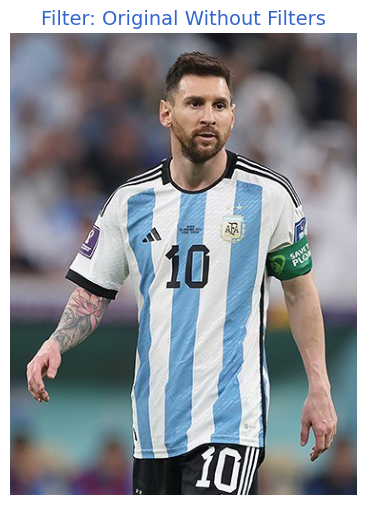

In [62]:
visualize_filter("Original Without Filters", image)

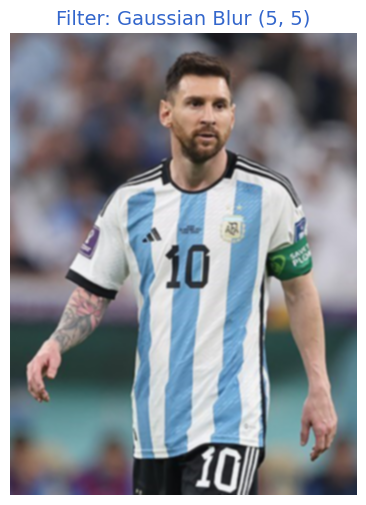

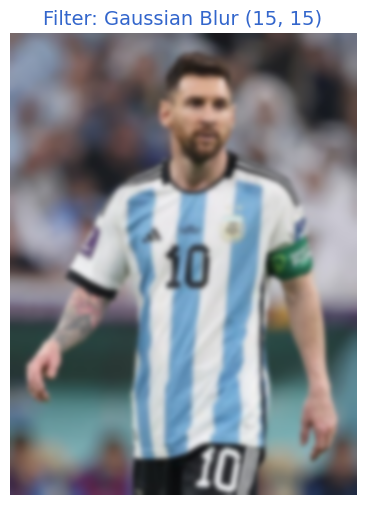

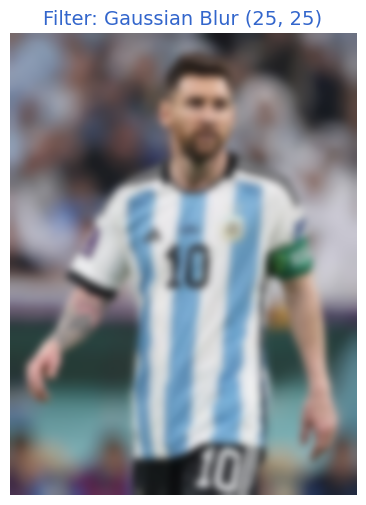

In [63]:
apply_gaussian_blur(image)

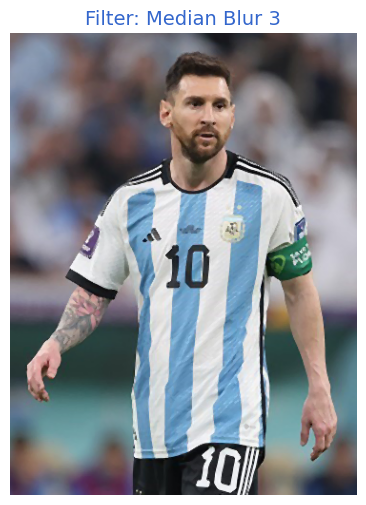

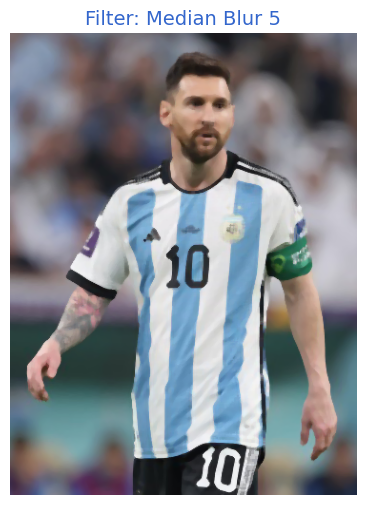

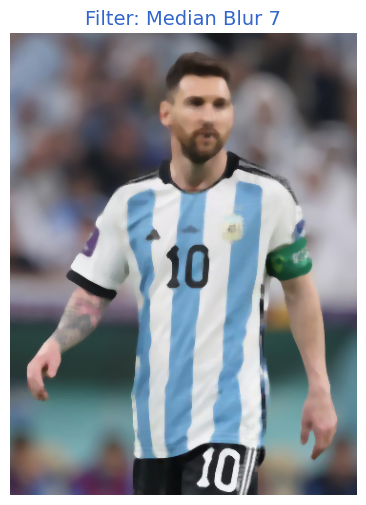

In [64]:
apply_median_blur(image)

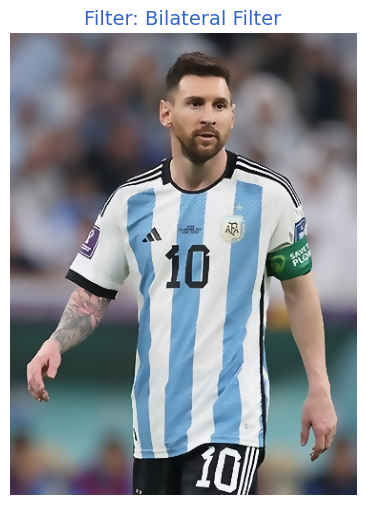

In [65]:
apply_bilateral_filter(image)

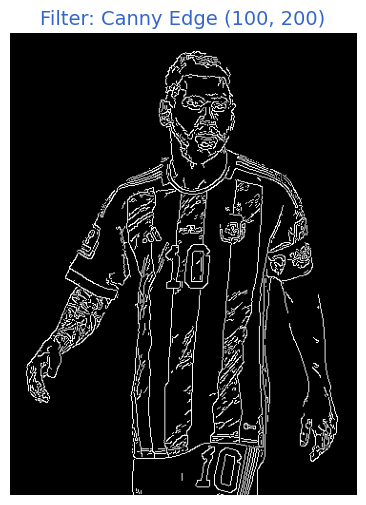

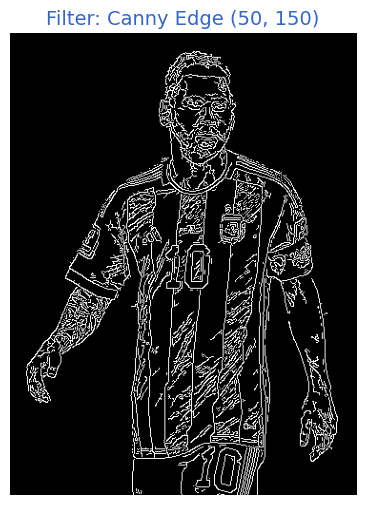

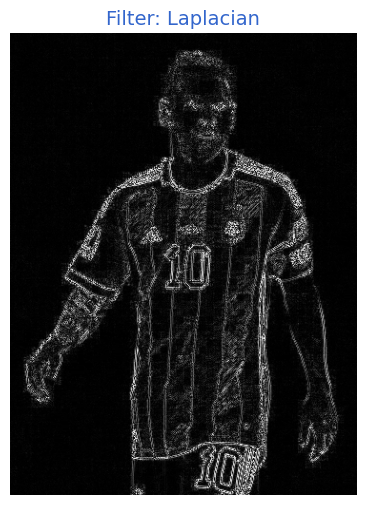

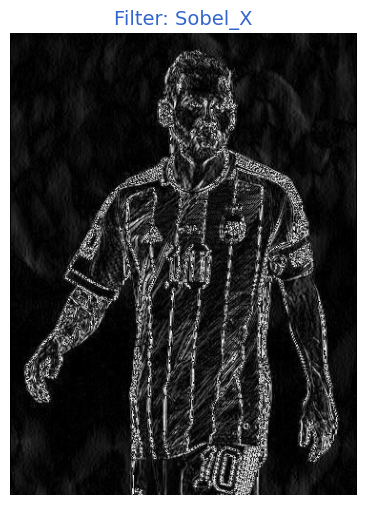

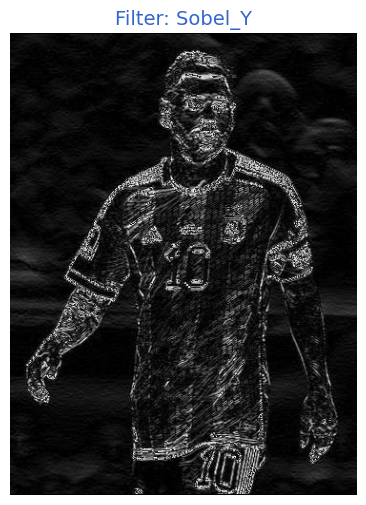

In [66]:
apply_edge_detection(image)

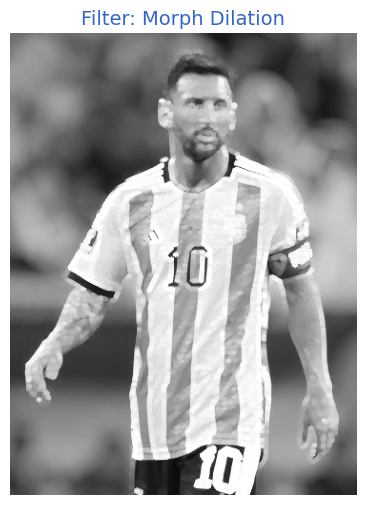

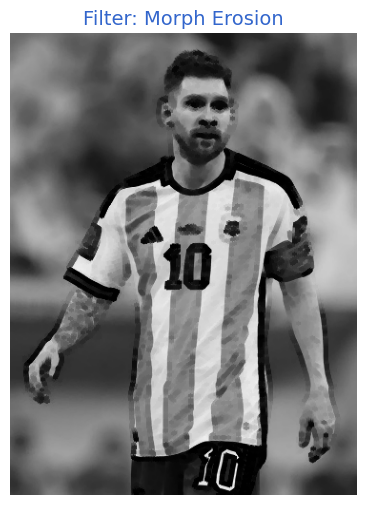

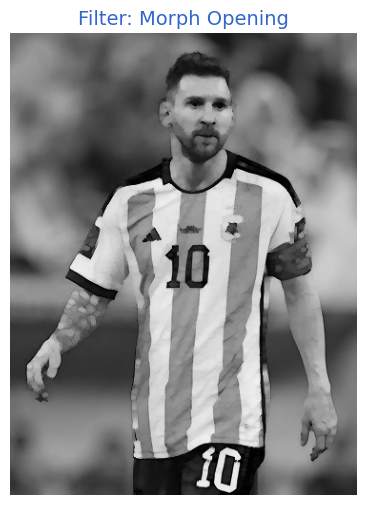

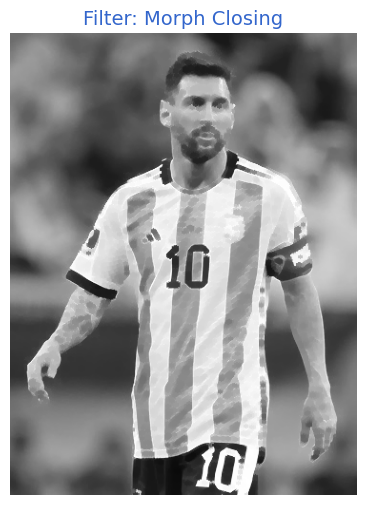

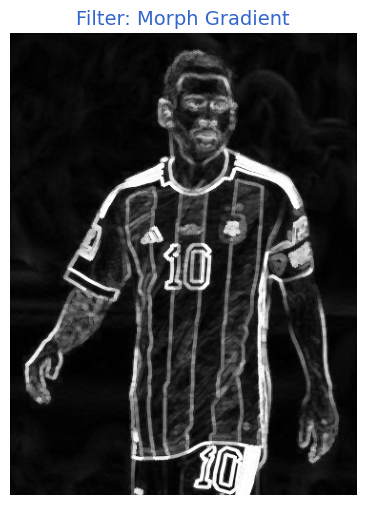

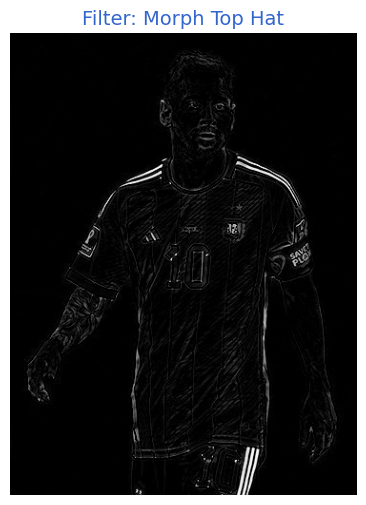

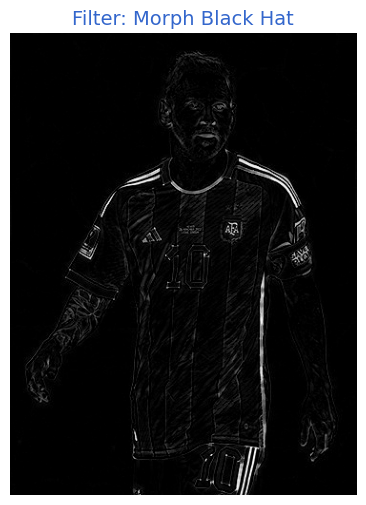

In [67]:
apply_morphological_ops(image)

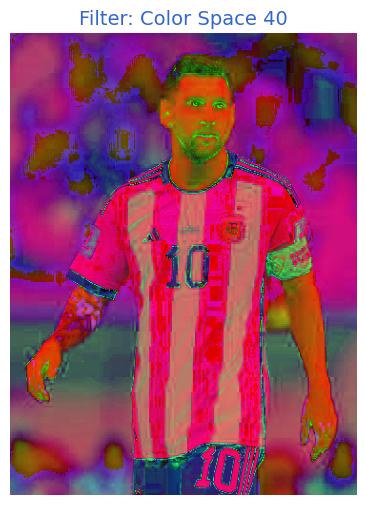

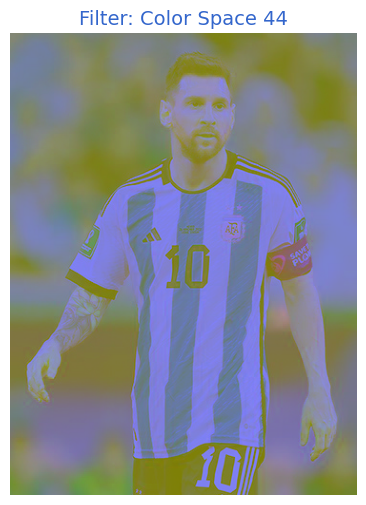

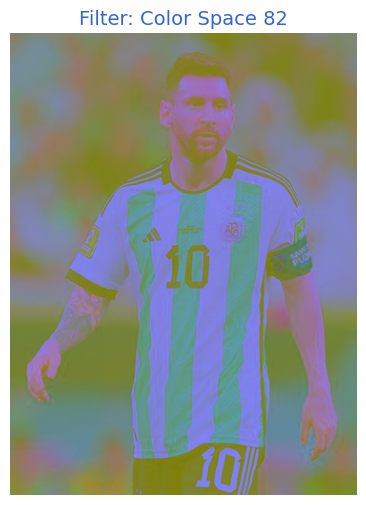

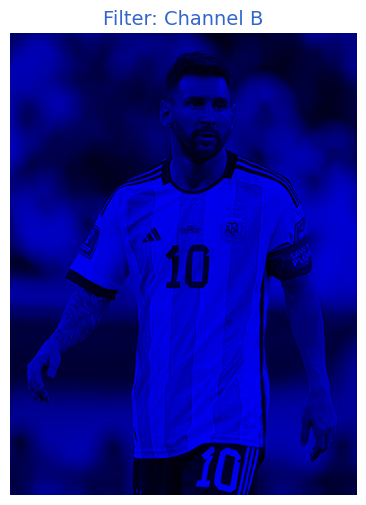

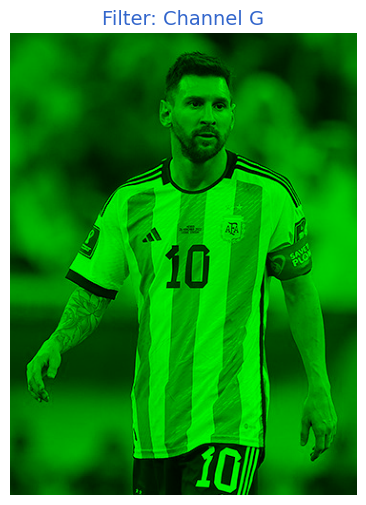

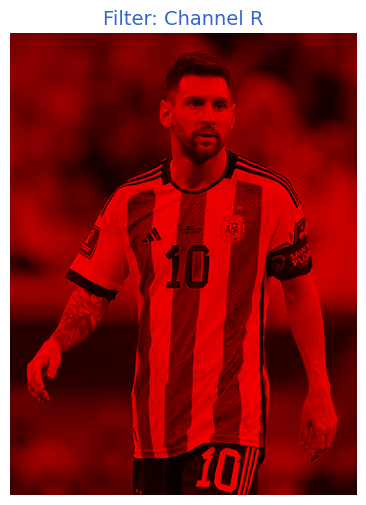

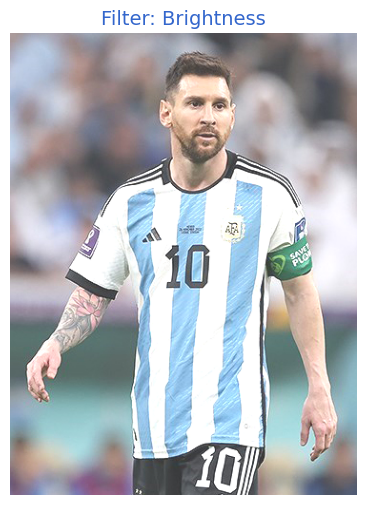

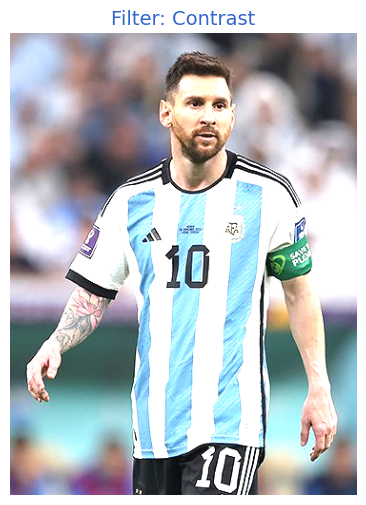

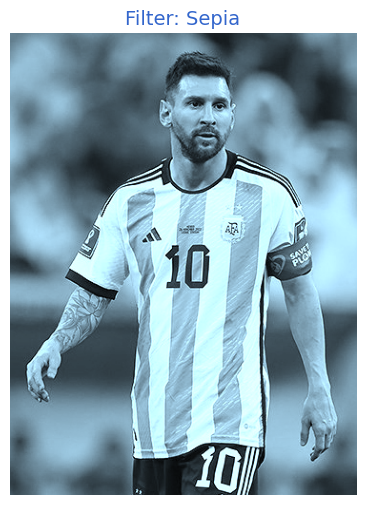

In [68]:
apply_color_operations(image)

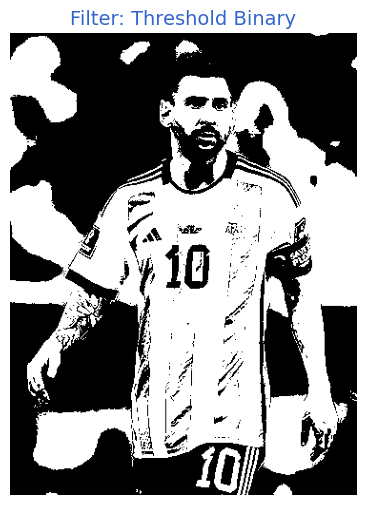

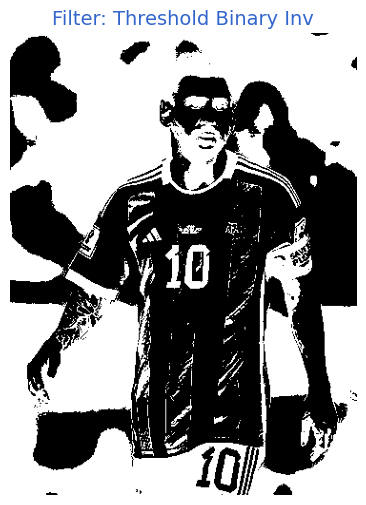

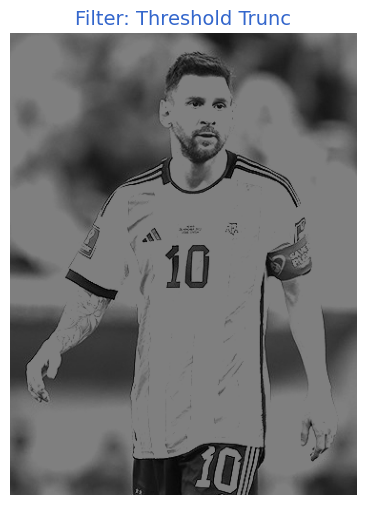

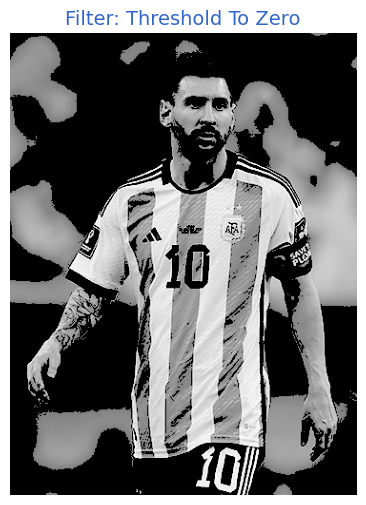

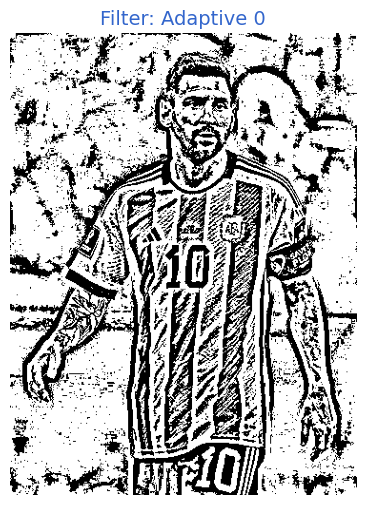

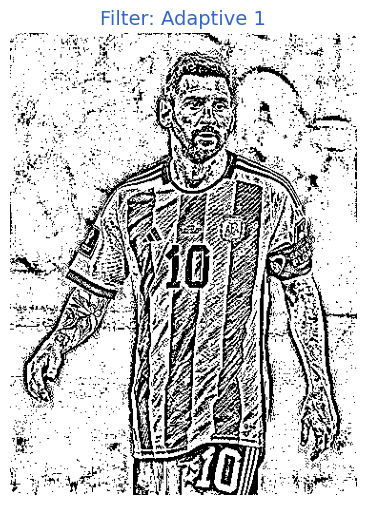

In [69]:
apply_thresholds(image)

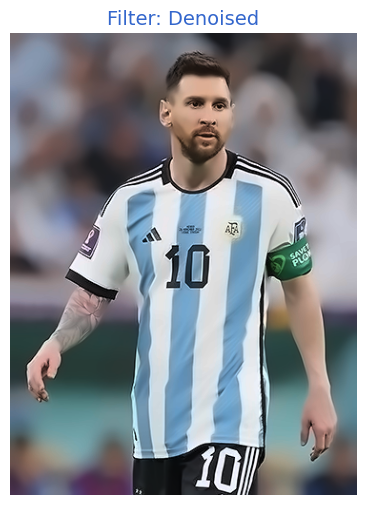

In [70]:
apply_noise_operations(image)

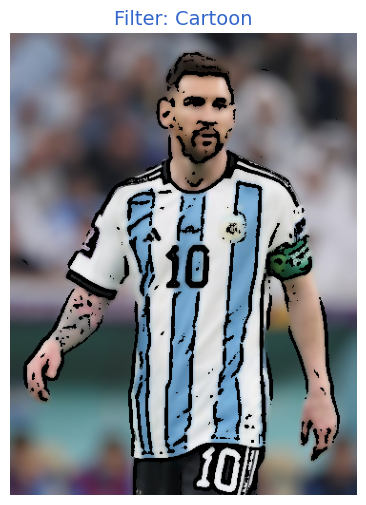

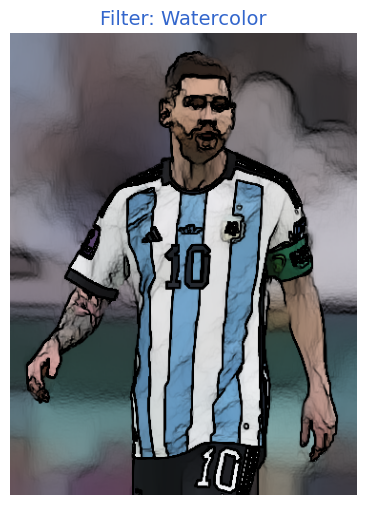

In [71]:
apply_artistic_effects(image)

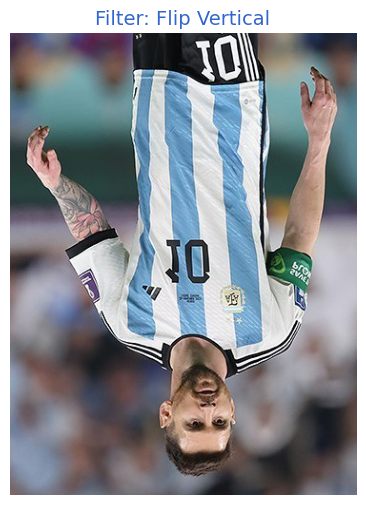

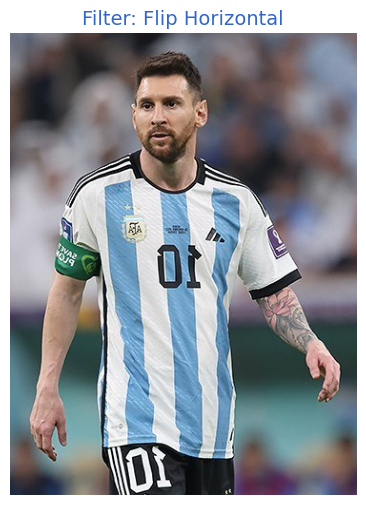

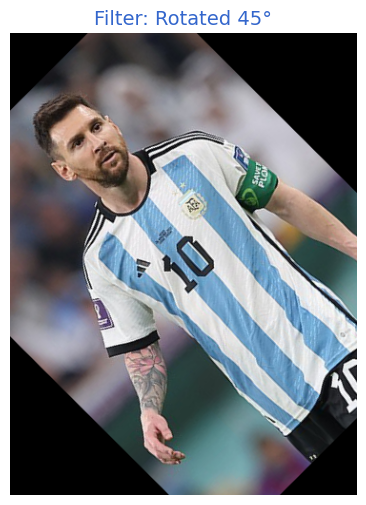

In [72]:
apply_geometric_transforms(image)

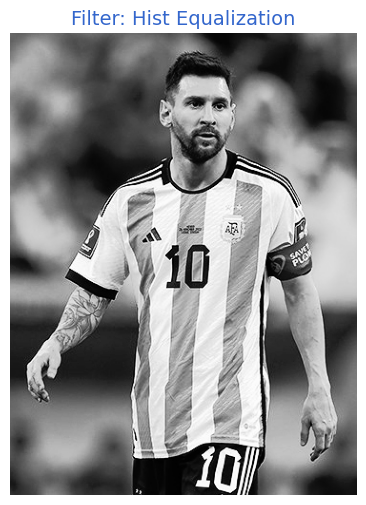

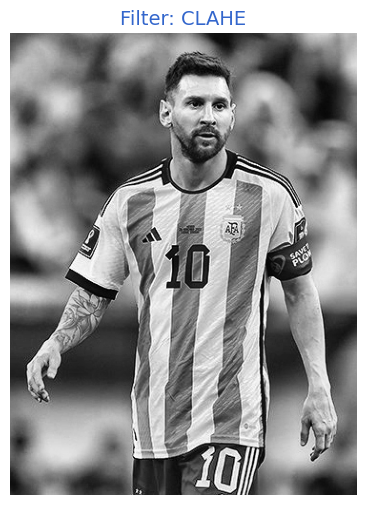

In [73]:
apply_advanced_filters(image)

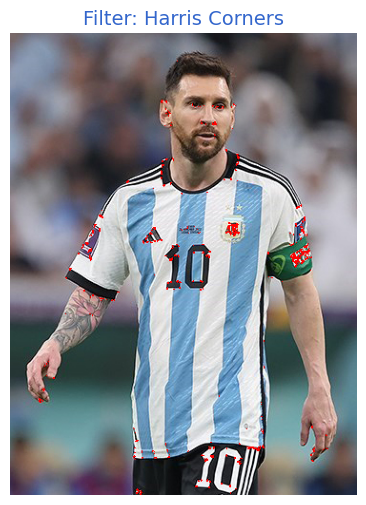

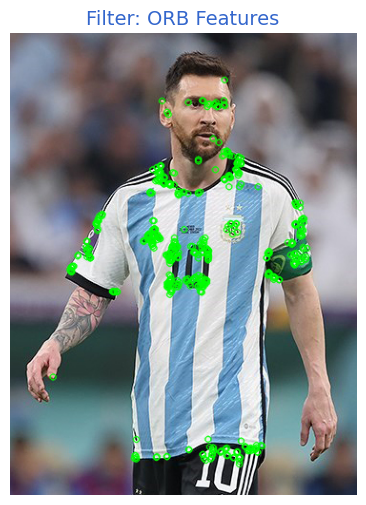

In [74]:
apply_feature_detection(image)

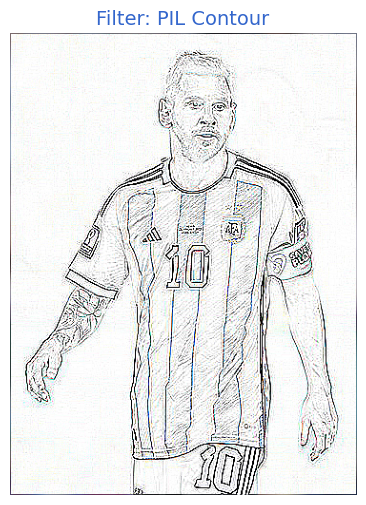

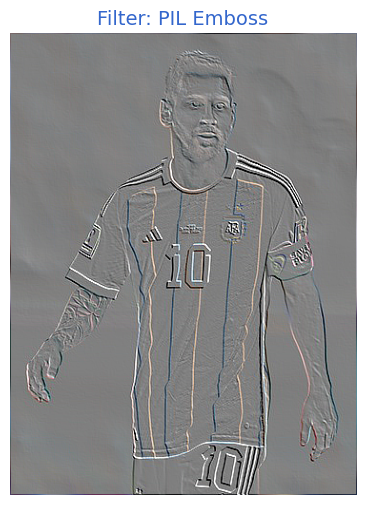

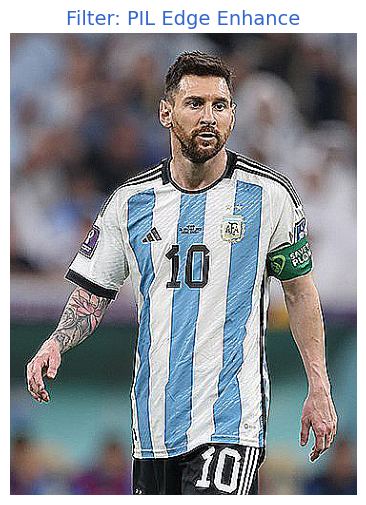

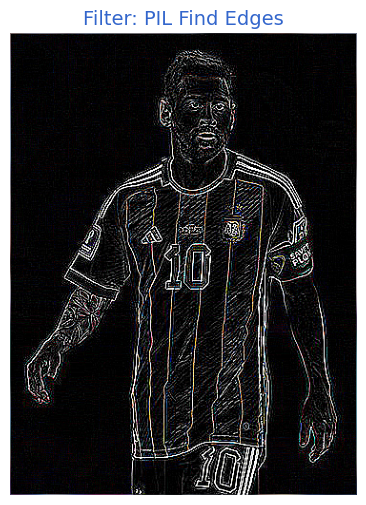

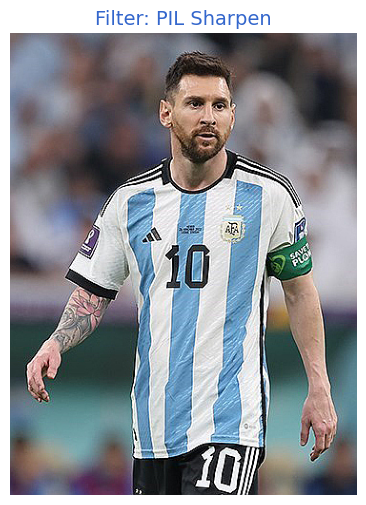

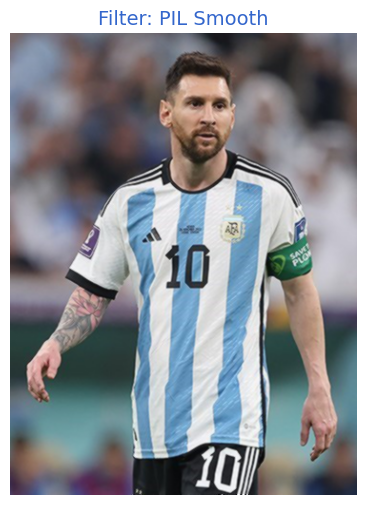

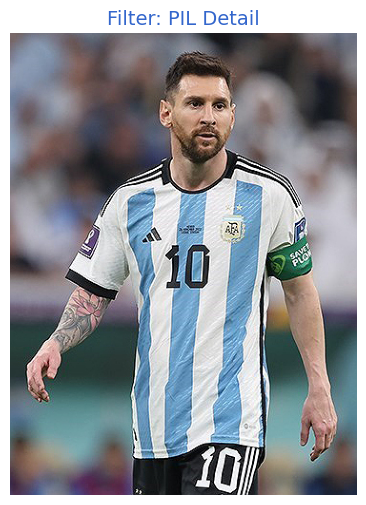

In [75]:
apply_pil_filters(image)

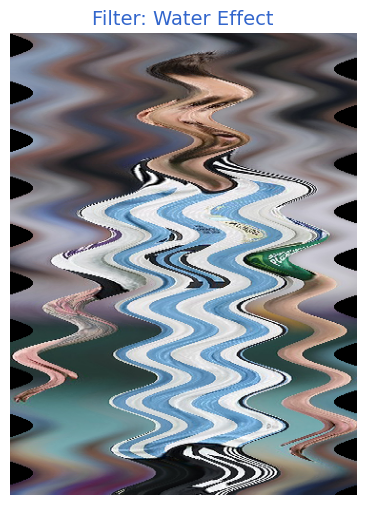

In [76]:
def apply_water_effect(image):
    rows, cols = image.shape[:2]
    dst = np.zeros_like(image)

    for i in range(rows):
        offset_x = int(25.0 * np.sin(2 * np.pi * i / 50.0))
        for j in range(cols):
            new_x = j + offset_x
            if 0 <= new_x < cols:
                dst[i, new_x] = image[i, j]

    visualize_filter("Water Effect", dst)

apply_water_effect(image)

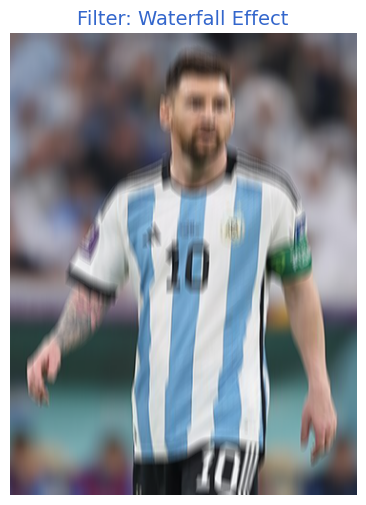

In [77]:
def apply_waterfall_effect(image):
    kernel_size = 15
    kernel = np.zeros((kernel_size, kernel_size))
    kernel[:, kernel_size // 2] = 1 / kernel_size

    waterfall = cv2.filter2D(image, -1, kernel)

    visualize_filter("Waterfall Effect", waterfall)

apply_waterfall_effect(image)

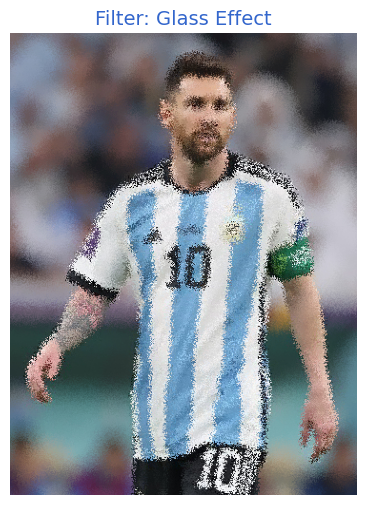

In [78]:
def apply_glass_effect(image):
    rows, cols, _ = image.shape
    dst = np.zeros_like(image)

    for i in range(rows):
        for j in range(cols):
            offset_x = np.random.randint(-3, 3)
            offset_y = np.random.randint(-3, 3)
            new_x = np.clip(i + offset_x, 0, rows - 1)
            new_y = np.clip(j + offset_y, 0, cols - 1)
            dst[i, j] = image[new_x, new_y]

    visualize_filter("Glass Effect", dst)

apply_glass_effect(image)

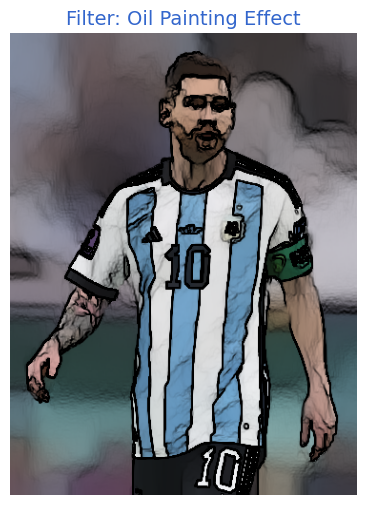

In [79]:
def apply_oil_painting_effect(image):
    oil_painting = cv2.stylization(image, sigma_s=60, sigma_r=0.6)
    visualize_filter("Oil Painting Effect", oil_painting)

apply_oil_painting_effect(image)

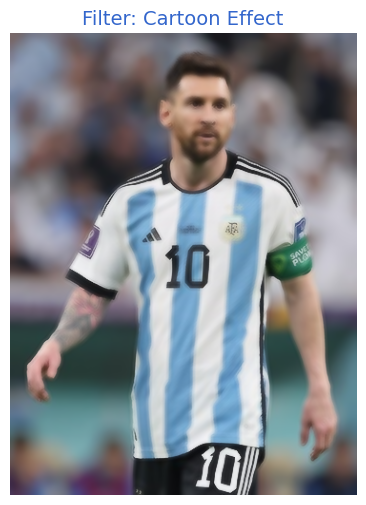

In [80]:
def apply_cartoon_effect(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.medianBlur(gray, 7)
    color = cv2.bilateralFilter(image, 9, 300, 300)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    visualize_filter("Cartoon Effect", cartoon)

apply_cartoon_effect(image)

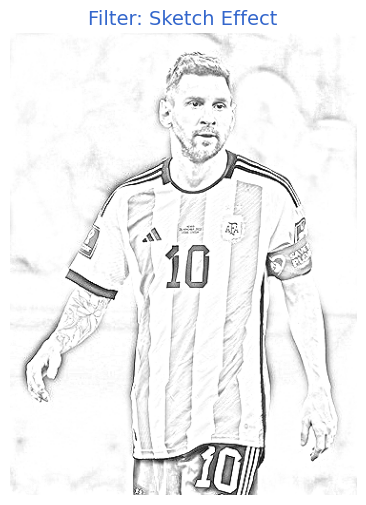

In [81]:
def apply_sketch_effect(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    inverted = cv2.bitwise_not(gray)
    blurred = cv2.GaussianBlur(inverted, (21, 21), 0)
    inverted_blur = cv2.bitwise_not(blurred)
    sketch = cv2.divide(gray, inverted_blur, scale=256.0)
    visualize_filter("Sketch Effect", sketch)

apply_sketch_effect(image)

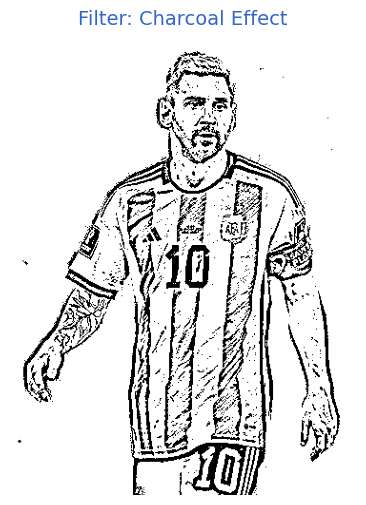

In [82]:
def apply_charcoal_effect(image):
    charcoal = cv2.adaptiveThreshold(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 10)
    visualize_filter("Charcoal Effect", charcoal)

apply_charcoal_effect(image)

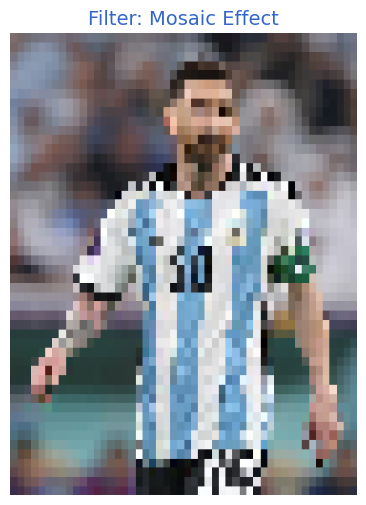

In [83]:
def apply_mosaic_effect(image):
    small = cv2.resize(image, (50, 50), interpolation=cv2.INTER_NEAREST)
    mosaic = cv2.resize(small, image.shape[:2][::-1], interpolation=cv2.INTER_NEAREST)
    visualize_filter("Mosaic Effect", mosaic)

apply_mosaic_effect(image)

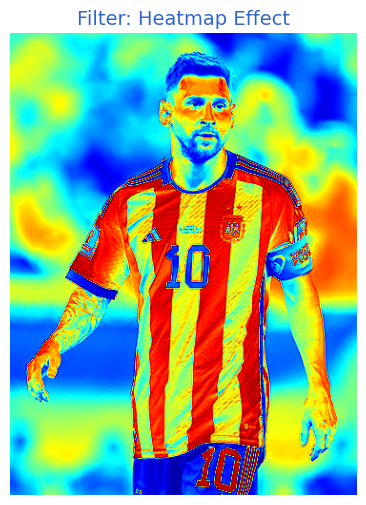

In [84]:
def apply_heatmap_effect(image):
    heatmap = cv2.applyColorMap(image, cv2.COLORMAP_JET)
    visualize_filter("Heatmap Effect", heatmap)

apply_heatmap_effect(image)

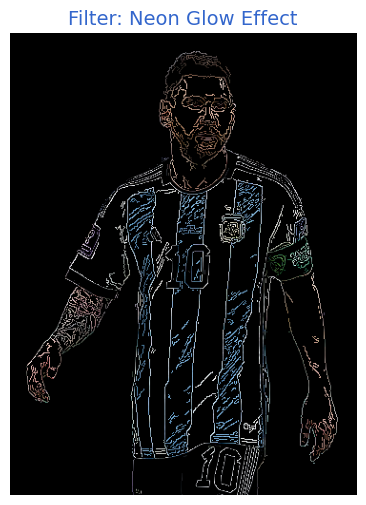

In [85]:
def apply_neon_effect(image):
    edges = cv2.Canny(image, 100, 200)
    neon = cv2.bitwise_and(image, image, mask=edges)
    visualize_filter("Neon Glow Effect", neon)

apply_neon_effect(image)

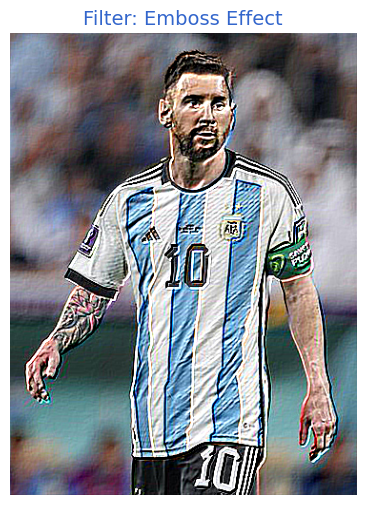

In [86]:
def apply_emboss_effect(image):
    kernel = np.array([[ -2, -1, 0],
                       [ -1,  1, 1],
                       [  0,  1, 2]])
    emboss = cv2.filter2D(image, -1, kernel)
    visualize_filter("Emboss Effect", emboss)

apply_emboss_effect(image)

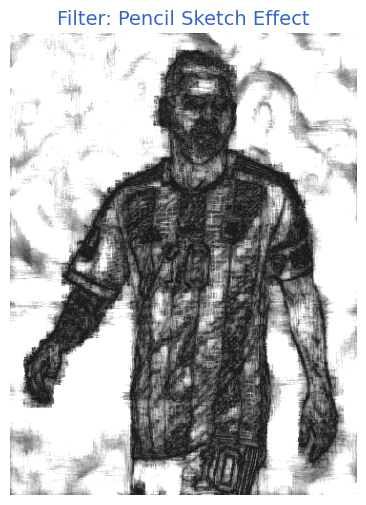

In [87]:
def apply_pencil_effect(image):
    pencil, _ = cv2.pencilSketch(image, sigma_s=60, sigma_r=0.07, shade_factor=0.05)
    visualize_filter("Pencil Sketch Effect", pencil)

apply_pencil_effect(image)

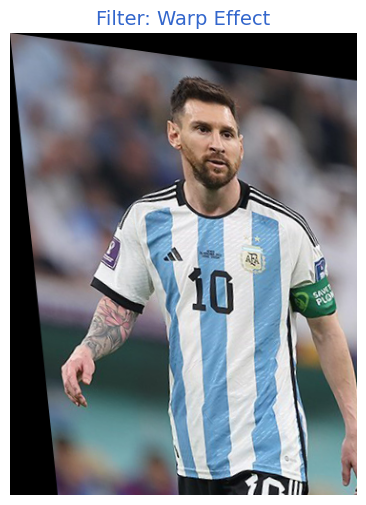

In [88]:
def apply_warp_effect(image):
    rows, cols, _ = image.shape
    src_points = np.float32([[0, 0], [cols-1, 0], [0, rows-1]])
    dst_points = np.float32([[0, 0], [cols-1, 50], [50, rows-1]])
    matrix = cv2.getAffineTransform(src_points, dst_points)
    warp = cv2.warpAffine(image, matrix, (cols, rows))
    visualize_filter("Warp Effect", warp)

apply_warp_effect(image)

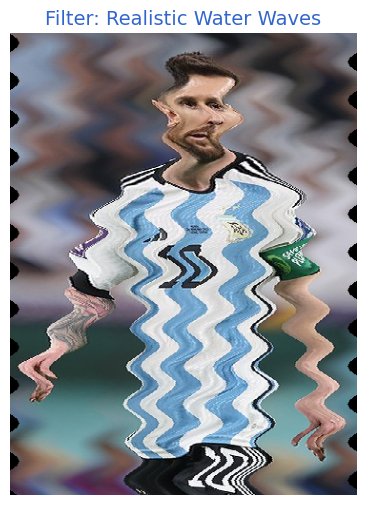

In [89]:
def apply_realistic_water_waves(image):
    rows, cols = image.shape[:2]
    dst = np.zeros_like(image)
    for i in range(rows):
        offset_x = int(10.0 * np.sin(2 * np.pi * i / 40.0))
        for j in range(cols):
            new_x = j + offset_x
            if 0 <= new_x < cols:
                dst[i, new_x] = image[i, j]
    visualize_filter("Realistic Water Waves", dst)

apply_realistic_water_waves(image)

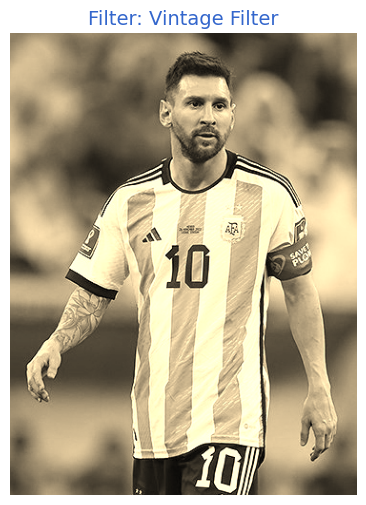

In [90]:
def apply_vintage_filter(image):
    sepia_filter = np.array([[0.272, 0.534, 0.131],
                              [0.349, 0.686, 0.168],
                              [0.393, 0.769, 0.189]])
    vintage = cv2.transform(image, sepia_filter)
    vintage = np.clip(vintage, 0, 255).astype(np.uint8)
    visualize_filter("Vintage Filter", vintage)

apply_vintage_filter(image)

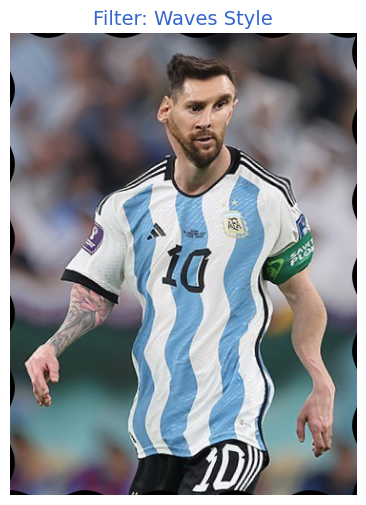

In [91]:
def apply_waves_style(image):
    rows, cols = image.shape[:2]
    x, y = np.meshgrid(np.arange(cols), np.arange(rows))
    amplitude = 5
    frequency = 0.08
    map_x = x + amplitude * np.sin(frequency * y)
    map_y = y + amplitude * np.cos(frequency * x)
    waves = cv2.remap(image, map_x.astype(np.float32), map_y.astype(np.float32), cv2.INTER_LINEAR)
    visualize_filter("Waves Style", waves)

apply_waves_style(image)